# Inference

This document partially covers the following modules:

* `tramway.analyzer.mapper`
* `tramway.analyzer.browser`

Like most of the pages of this documentation, this one originates from a IPython notebook and, as a consequence, the code examples are sequentially run, hence the inclusion of a few transition steps.

**TRamWAy** features multiple models to infer physical properties of random walks, including diffusivity, effective potential, drift, force, etc.
Most of the available models are based on the overdamped Langevin equation.


## Models for random walks

For extensive introduction, please refer to the [official documentation](https://tramway.readthedocs.io/en/latest/inference.html#concepts) or the [reference article](https://doi.org/10.1016/j.bpj.2008.12.2191).

Briefly, we consider the problem of maximizing the posterior probability for model parameters $\theta$ given the observed particle displacements $T_i = \{(\Delta t_j, \Delta\textbf{r}_j)\}$ partitioned into bins or microdomains whose index is denoted by $i$:

$$
\newcommand{argmax}{\underset{\theta}{\operatorname{argmax}}}
\argmax P(\theta|T) = \argmax P(\theta) \prod_i P(T_i|\theta_i)
$$

The various models **TRamWAy** features give different formulae for the local likelihoods $P(T_i|\theta_i)$.
In addition, $P(\theta)$ can be treated as a regularization term, often in the shape of an improper prior (not normalized).

The main models are recaped in the following table:

| model name | &nbsp; model parameters &nbsp; | model for individual displacements &nbsp; &nbsp; &nbsp; &nbsp; |
--: | :-: | :--
| [D](https://tramway.readthedocs.io/en/latest/inference.html#d-inference) | diffusivity $D$ | $\frac{d\textbf{r}}{dt} = \sqrt{2D(\textbf{r})} \xi(t)$ | $P(T_i | D_i) \propto \prod_j \frac{\textrm{exp}\left(-\frac{\Delta\textbf{r}_j^2}{4\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}\right)}{4\pi\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}$ |
| [DD](https://tramway.readthedocs.io/en/latest/inference.html#dd-inference) | diffusivity $D$<br />drift $\textbf{a}$ | $\frac{d\textbf{r}}{dt} = \sqrt{2D(\textbf{r})} \xi(t) + \textbf{a}(\textbf{r})$ | $P(T_i | D_i, \textbf{a}_i) \propto \prod_j \frac{\textrm{exp}\left(-\frac{\left(\Delta\textbf{r}_j - \textbf{a}_i\right)^2}{4\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}\right)}{4\pi\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}$ |
| [DF](https://tramway.readthedocs.io/en/latest/inference.html#df-inference) | diffusivity $D$<br />force $\textbf{F}$ | $\frac{d\textbf{r}}{dt} = \sqrt{2D(\textbf{r})} \xi(t) + D(\textbf{r})\textbf{F}(\textbf{r})$ | $P(T_i | D_i, \textbf{F}_i) \propto \prod_j \frac{\textrm{exp}\left(-\frac{\left(\Delta\textbf{r}_j - \frac{D_i\textbf{F}_i\Delta t_j}{k_BT}\right)^2}{4\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}\right)}{4\pi\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}$ |
| [DV](https://tramway.readthedocs.io/en/latest/inference.html#dv-inference) | diffusivity $D$<br /><span style="white-space: nowrap;">effective potential $V$</span> | $\frac{d\textbf{r}}{dt} = \sqrt{2D(\textbf{r})} \xi(t) - D(\textbf{r}) \nabla V(\textbf{r})$ | $P(T_i | D_i, V_i) \propto \prod_j \frac{\textrm{exp}\left(-\frac{\left(\Delta\textbf{r}_j + \frac{D_i\nabla V_i\Delta t_j}{k_BT}\right)^2}{4\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}\right)}{4\pi\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}$ |

As an example, for the DV model, at bin $i$ with assigned displacements $T_i$, the local likelihood is:

$$
P(T_i | D_i, V_i) \propto \prod_j \frac{\textrm{exp}\left(-\frac{\left(\Delta\textbf{r}_j + D_i\nabla V_i\Delta t_j\right)^2}{4\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}\right)}{4\pi\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}
$$

with $\sigma^2$ the experimental localization error.

In [1]:
from tramway.analyzer import *
from tramway.core import translocations_to_trajectories
import numpy as np

In [2]:
from src.inference import set_notebook_theme
set_notebook_theme()

from matplotlib import pyplot as plt

See [https://github.com/DecBayComp/tramway-tour](https://github.com/DecBayComp/tramway-tour).

The preset analyzer is programmed to load a designated SPT data file, extract the data in a single region of interest, build a k-means-based tessellation, and assign the particle locations to the different Voronoi cells with an additional adjustment to ensure at least 10 locations are associated with each cell.

In [3]:
from src.inference import reset_data, preset_analyzer
reset_data()

### Stochastic *DV*

A fast implementation of the *DV* model, that allows temporal smoothing in addition to spatial smoothing, is the `'stochastic.dv'` model.

In [4]:
a, assignment = preset_analyzer()

a.mapper = mapper.MapperPlugin('stochastic.dv')

#### Setting the smoothing priors

The `'stochastic.dv'` model features the following penalty on the diffusivity $D$ (or similarly the effective potential $V$):

$$
P(D) \propto \sum_{i} \sum_{j\in N_i}\frac{(D_j-D_i)^2}{||\textbf{r}_j-\textbf{r}_i||^2}
$$

with $i$ all the existing bin/microdomain indices and $N_i$ the subset of neighbor bins.

This is used as a prior probability function, but is not a proper probability function.
Per default, no normalization is performed to allow maximum control on the regularization effect, especially across multiple datasets.

Here we normalize as follows:

In [5]:
n = assignment.number_of_cells

expected_high_delta_D = .2
expected_high_delta_V = 8

diffusivity_prior_z = (expected_high_delta_D / a.tesseller.resolution) ** 2 / n
potential_prior_z = (expected_high_delta_V / a.tesseller.resolution) ** 2 / n

Most often, the inferred diffusivity is not as sensitive to the smoothing as the effective potential is.
We recommend smoothing the diffusity by a larger factor than that of the potential.

In [6]:
a.mapper.diffusivity_prior = 15 / diffusivity_prior_z
a.mapper.potential_prior = 10 / potential_prior_z

#### Running the inference

This is done calling the `infer` method, passing as input argument the assignment previously given by the `sample` method.

In [7]:
%%time

a.mapper.verbose = False

maps = a.mapper.infer(assignment)

CPU times: user 37.1 s, sys: 6.04 s, total: 43.2 s
Wall time: 6min 56s


#### Plotting the inferred parameters

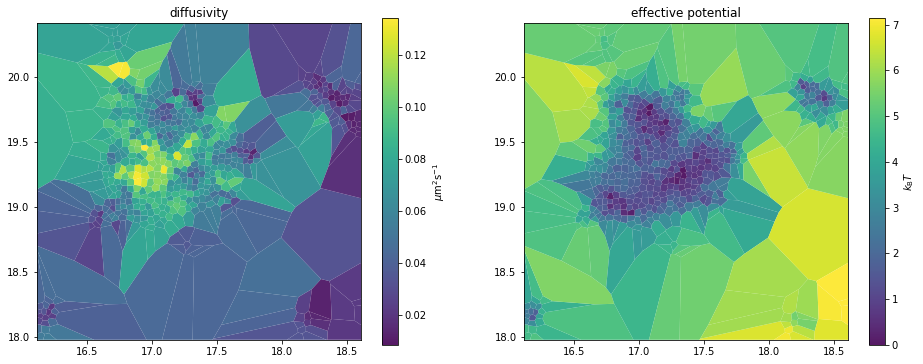

In [8]:
from matplotlib import pyplot as plt

_, axes = plt.subplots(1, 2, figsize=(16,6))

a.mapper.mpl.plot(maps, 'diffusivity', assignment, axes=axes[0], title='diffusivity', unit='std')
a.mapper.mpl.plot(maps, 'potential', assignment, axes=axes[1], title='effective potential', unit='std')

#### Departing from a density-based measurement of the interactions

Per default, the effective potential is initialized as a scaled map of local density. The inference rescales and adjusts the potential map.

To ensure the inferred potential purely reflects the information carried by the local displacements, and does not derive from the local density, one can initialize the effective potential as a flat landscape with `V0=0`:

In [9]:
%%time

a, assignment = preset_analyzer()

a.mapper = mapper.MapperPlugin('stochastic.dv')
a.mapper.diffusivity_prior = 15 / diffusivity_prior_z
a.mapper.potential_prior = 10 / potential_prior_z

a.mapper.V0 = 0.  # <-- the only difference

a.mapper.verbose = False

alt_maps = a.mapper.infer(assignment)

CPU times: user 1min 20s, sys: 13.2 s, total: 1min 33s
Wall time: 14min 44s


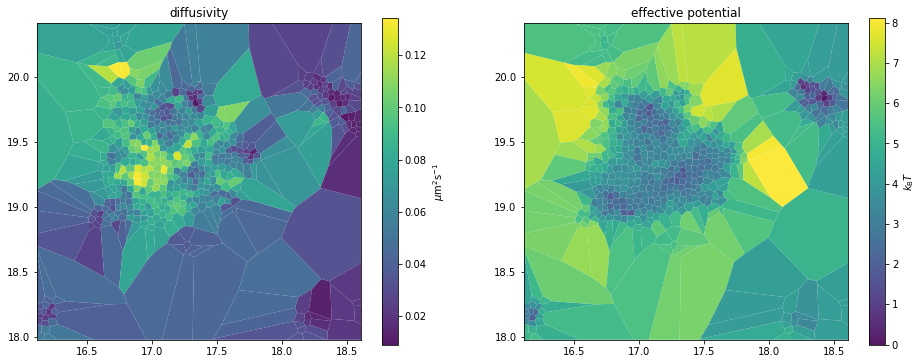

In [10]:
_, axes = plt.subplots(1, 2, figsize=(16,6))

a.mapper.mpl.plot(alt_maps, 'diffusivity', assignment, axes=axes[0], title='diffusivity', unit='std')
a.mapper.mpl.plot(alt_maps, 'potential', assignment, axes=axes[1], title='effective potential', unit='std')

Because of the relative nature of a potential energy, we cannot compare raw values, but rather differences.
To emphasize the central fine-grain area, we adjust the color scale and observe that, in this example, the effective potential converges to a very same pattern in high-density (fine-grain) areas.

However, the different initializations lead to slightly different values in low-density (coarse-grain) areas especially at the ridges between energy basins.

This may also explain different average levels between distant energy sinks, as can be observed in the top-right high-density (fine-grain) area.

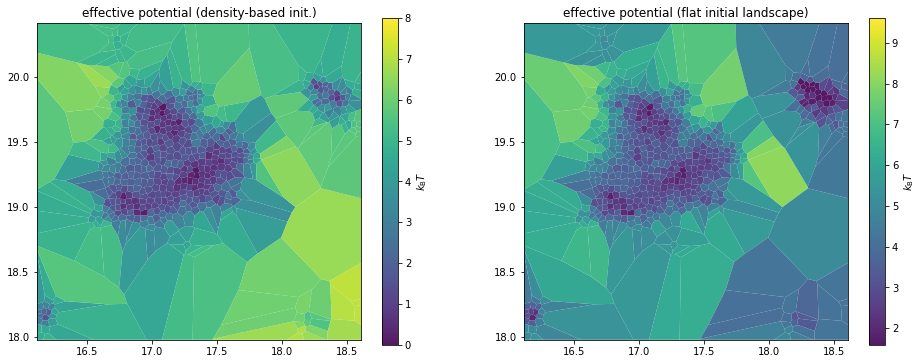

In [11]:
_, axes = plt.subplots(1, 2, figsize=(16,6))

a.mapper.mpl.plot(maps, 'potential', assignment, clim=[0,8], axes=axes[0], title='effective potential (density-based init.)', unit='std')
a.mapper.mpl.plot(alt_maps, 'potential', assignment, clim=[1.6,9.6], axes=axes[1], title='effective potential (flat initial landscape)', unit='std')

## Saving parameter maps to *.rwa* files

In the above example, with a single set of maps on a single region of interest, we can explicitly dump the above assignment and maps in a *.rwa* file:

In [12]:
import os.path

rwa_file = os.path.splitext(a.spt_data.filepath)[0] + '.rwa'

with a.spt_data.autosaving() as analysis_tree:
    analysis_tree.rwa_file = rwa_file
    analysis_tree['my roi'] = assignment
    analysis_tree['my roi']['my maps 0'] = maps
    analysis_tree['my roi']['my maps 1'] = alt_maps

This appends the new records to the existing analyses if the file already exists.

The structure of an analysis tree is flexible, but preferably includes the full SPT data at the root node (as a `DataFrame` object), the different assignments as immediate children nodes (as `Partition` objects), and finally the inferred maps as grand-children (as `Maps` objects):

In [13]:
print(analysis_tree)

<class 'pandas.core.frame.DataFrame'>
	'my roi' <class 'tramway.tessellation.base.Partition'>
		'my maps 0' <class 'tramway.inference.base.Maps'>
		'my maps 1' <class 'tramway.inference.base.Maps'>


This analysis tree can be loaded using the `load_rwa` function exported by the `tramway.helper` module:

In [14]:
from tramway.helper import load_rwa

reloaded_analysis_tree = load_rwa(rwa_file)
#print(reloaded_analysis_tree)

Generally speaking, inspecting a *.rwa* file may be easier without the help of the `RWAnalyzer` object, and the reader is referred to the [command-line interface](https://tramway.readthedocs.io/en/latest/inference.html#basic-usage) or the `tramway.helper` [package](https://tramway.readthedocs.io/en/latest/inference.html#basic-usage) for functions like `load_rwa`, `cell_plot` or `map_plot`.

Indeed, an `RWAnalyzer` object cannot be loaded directly from a *.rwa* file.
Especially, a single `RWAnalyzer` object may handle multiple files, and a *.rwa* file may contain analysis artefacts generated by different `RWAnalyzer` objects.

In addition, even a specific analysis path from a *.rwa* file does not contain enough information to rebuild an `RWAnalyzer` object.

First, we would need to have the region of interest defined in an additional file. Such a file can be generated as follows:

In [15]:
roi_file = os.path.splitext(a.spt_data.filepath)[0] + '-roi.txt'

f = single(a.spt_data)
f.roi.to_ascii_file(roi_file)

See the [roi.ipynb notebook about ROI](roi.md) for more information.

However, an analysis based on a `RWAnalyzer` object is mostly declarative. The entire computation can be described as a series of attribute assignments, and eventually triggered by a single line of code.

### Segmenting and inferring all at once

To further ease the manipulation of data files, including *.rwa* files, the `tramway.analyzer` package features some convenient building blocks, especially `tessellate_and_infer`.

For example, to reproduce the steps of the DV inference above, on top of a k-means-based tessellation with local adjustments to reach a minimum number of 10 data points per space bin:

In [16]:
from tramway.analyzer import *
import numpy as np
import pandas as pd

a = RWAnalyzer()

a.spt_data.from_ascii_file('../data/Image_traj.txt')
a.spt_data.frame_interval = .04 # in s
a.spt_data.localization_precision = .02 # in µm

a.roi.from_ascii_files() # default filepath will be '../data/Image_traj-roi.txt'

a.tesseller = tessellers.KMeans
a.tesseller.resolution = .05

a.sampler = sampler.Knn(10)

a.mapper = mapper.MapperPlugin('stochastic.dv')
# details for the priors below are skipped
a.mapper.diffusivity_prior = 595.3125
a.mapper.potential_prior = 0.248046875
a.mapper.verbose = False

In [17]:
a.pipeline.append_stage(stages.tessellate_and_infer(sampling_label='my roi', map_label='my map 0'))

The last expression above does not run the computation. It only schedules it for later execution by the `run` method. The resulting analysis artefacts are saved in a *.rwa* file whose name per default is borrowed by the SPT data filename, replacing the original extension by the *.rwa* extension.

Note that `tessellate_and_infer` (similarly `tessellate`) will discard the static trajectories.
This additional preprocessing step was not performed by the `preset_analyzer` function to keep it as simple as possible.

With a few additional lines, the computation can be dispatched to a computer cluster instead of being run on the local machine. This, however, is out of the scope of this section.

The computation can be triggered calling the `run` method:

In [18]:
%%script echo skipping

a.pipeline.run()

skipping


We skip the execution of the above `run` call so that the present document (originally a Jupyter notebook) can be run in a limited amount of time.

## Post-processing

In [19]:
a.pipeline.reset()

Instead, if the *.rwa* file already exists, we can load and manipulate it:

In [20]:
a.pipeline.append_stage(stages.reload(skip_missing=False))
a.pipeline.run()

To show the same maps as above, in a different flavor, let us plot 3D surfaces:

In [21]:
%%capture
import sys
!"{sys.executable}" -m pip install plotly nbformat

In [22]:
import io
import plotly.io as pio
pio.renderers.default='notebook'
from IPython.display import HTML, display
import plotly.graph_objects as go
from plotly.subplots import make_subplots

for r in a.roi.as_support_regions(): # in this example, we have a single ROI
    
    assignment_ = r.get_sampling('my roi')
    maps_ = assignment_.get_child('my maps 0')
    
    fig = make_subplots(rows=1, cols=2,
        specs=[[{'type': 'surface'}, {'type': 'surface'}]],
        subplot_titles=['diffusivity', 'effective potential'])
    
    a.mapper.plotly.plot_surface(maps_, 'diffusivity', assignment_, fig=fig, col=0,
        colorbar=dict(thickness=20, x=0.46))
    a.mapper.plotly.plot_surface(maps_, 'potential', assignment_, fig=fig, col=1,
        colorbar=dict(thickness=20, x=1.02))

    fig.update_layout(
        scene1=dict(
            zaxis=dict(range=[-.07,.13]),
            camera=dict(eye=dict(x=.8, y=.8, z=1.4)),
        ),
        scene2=dict(
            zaxis=dict(range=[-2,7]),
            camera=dict(eye=dict(x=.5, y=.5, z=2.)),
        ),
    )

    #fig.show() # nbconvert cannot export the figure this way
    
    # ...so instead:
    buffer = io.StringIO()
    fig.write_html(buffer)
    display(HTML(buffer.getvalue()))

## Data structures

The `Maps` objects previously generated, for example `maps` in the cell above, contain the distributed parameter estimates:

In [23]:
print(maps)

mode:              stochastic.dv
diffusivity_prior: 595.3125
potential_prior:   0.248046875
runtime:           415.1516649723053
sigma:             0.02
verbose:           False
resolution:        CONVERGENCE: DELTA F < FTOL
niter:             47188
features:          ['diffusivity', 'potential', 'force']
maps:              <class 'pandas.core.frame.DataFrame'>


The values can either be accessed reading the `maps` attribute: 

In [24]:
import pandas as pd
pd.set_option('display.max_rows', 6)

In [25]:
maps.maps

,diffusivity,potential,force x,force y
0,0.053244,4.645154,0.686861,13.320843
1,0.047111,4.670046,13.748410,9.078454
2,0.027746,2.936693,13.747172,19.946857
...,...,...,...,...
632,0.026505,4.787913,-0.731641,1.122030
633,0.031321,4.622773,-14.894524,-4.183527
634,0.041528,4.902439,-5.626045,-1.013357


or indexing by parameter name:

In [26]:
maps['force'].rename(columns=lambda name: name[-1])

,x,y
0,0.686861,13.320843
1,13.748410,9.078454
2,13.747172,19.946857
...,...,...
632,-0.731641,1.122030
633,-14.894524,-4.183527
634,-5.626045,-1.013357


## Spatiotemporal resolution of the diffusivity and potential energy

Compared with an inference resolved in space only, we can based a spatio-temporal inference on the basis, usually decreasing the resolution (increasing the bin size represented by attribute `resolution`

In [27]:
from tramway.analyzer import *
import numpy as np
import pandas as pd

a = RWAnalyzer()

a.spt_data.from_ascii_file('../data/Image_traj.txt')
a.spt_data.frame_interval = .04 # in s
a.spt_data.localization_precision = .02 # in µm

a.roi.from_ascii_files() # default filepath will be '../data/Image_traj-roi.txt'

a.tesseller = tessellers.KMeans
a.tesseller.resolution = .1

a.sampler = sampler.Knn(10)

a.mapper = mapper.MapperPlugin('stochastic.dv')
a.mapper.verbose = False

We additionally specify the temporal processing:

In [28]:
a.time = time.SlidingWindow(duration=60, shift=30)

a.mapper.diffusivity_spatial_prior = 10.
a.mapper.diffusivity_time_prior = 100.
a.mapper.potential_spatial_prior = .01
a.mapper.potential_time_prior = 100.

a.mapper.ftol = 1e-3

And run as usual:

In [29]:
sampling_label = lambda roi_label: roi_label + ' - kmeans + 60s window'
map_label = 'dv maps'

a.pipeline.append_stage(stages.tessellate_and_infer(
    sampling_label=sampling_label,
    map_label=map_label,
    load_rwa_files=True,
    overwrite=True,
))

In [30]:
%%time

a.pipeline.run()

loading .rwa file for source: ../data/Image_traj.txt...
tessellating roi: 'roi000' (in source '../data/Image_traj.txt')...
inferring roi: 'roi000' (in source '../data/Image_traj.txt')...


CPU times: user 1min 35s, sys: 17 s, total: 1min 52s
Wall time: 24min 38s


#### `sampling_label`

If no ROI are defined, it is safe to pass a static `str` value.

If ROI are defined and a single segmentation per ROI is expected, it is safe to ignore the `sampling_label` argument.

However, if ROI are defined and segmenting in multiple ways is not excluded, it is recommended to choose labels that refer both to the ROI and the segmentation parameters; hence the above `sampling_label` that takes the default ROI label and combines it with an additional segmentation-related label.

#### `load_rwa_files` and `overwrite`

Per default, if the SPT data source is not defined as *.rwa* files, `tessellate_and_infer` seeks for corresponding *.rwa* files and loads them if found. The `load_rwa_files` argument controls this behavior and can be set to `False` to override the default.

Per default, if the SPT data source is read from *.rwa* files, including by the action of the `load_rwa_files` argument, if analysis artefacts are already available in the analysis trees with the same labels, the analysis is skipped. The `overwrite` argument controls this behavior and can be set to `True` to override the default.


## Movie rendering

Dynamic maps can be rendered as movies:

In [31]:
r = single(a.roi)
assignment = r.get_sampling(sampling_label)
maps = assignment.get_child(map_label)

In [32]:
%%capture
# initialize the movie for a parameter map
from matplotlib import pyplot as plt

fig, ax = plt.subplots(figsize=(8,6))

movie = a.mapper.mpl.animate(fig, maps, feature='diffusivity',
                axes=ax, unit='std', overlay_locations=True)

In [33]:
# render the movie
from IPython.display import HTML

HTML(movie.to_jshtml())

The `movie` object is a Matplotlib animation. Such objects can be combined as subplots of a same figure:

In [34]:
%%capture
fig, axes = plt.subplots(1, 2, figsize=(16,6))

movie = a.mapper.mpl.animate(fig, maps, feature='diffusivity',
                axes=axes[0], unit='std')

movie = a.mapper.mpl.animate(movie, maps, feature='potential',
                axes=axes[1], unit='std')

In [35]:
HTML(movie.to_jshtml())

Note that, in the second call to `animate`, `movie` is passed as first argument instead of `fig`.

## Browsing many maps

For datasets with multiple SPT data files and/or multiple regions of interest per files, or else multiple segmentations per region of interest and/or multiple inferred parameter maps per assignment,
the `RWAnalyzer` object features a browsing utility based on the *bokeh* library and made available as the `browser` attribute of the object.

In [36]:
%%capture
import sys
!"{sys.executable}" -m pip install bokeh==2.2.3

In [37]:
from tramway.analyzer import *

a = RWAnalyzer()
a.spt_data.from_rwa_files('../data/*.rwa')

# the notebook kernel is not aware of the notebook it runs;
# let it know where the code is
a.browser.script = 'inference.ipynb'

# make bokeh run the current notebook cell only, not the entire notebook
a.browser.this_notebook_cell_only = True

a.browser.show_maps()

the designated .ipynb file will be exported;
be sure to save the notebook after any modification
so that the changes are reported in the .ipynb file

running: jupyter nbconvert --to python "inference.ipynb" --stdout
running: python -m bokeh serve --show /tmp/tmpyhta2q9i.py
interrupt the kernel to stop bokeh and proceed back in the notebook
2021-06-16 00:28:17,636 Starting Bokeh server version 2.2.3 (running on Tornado 6.1)
2021-06-16 00:28:17,637 User authentication hooks NOT provided (default user enabled)
2021-06-16 00:28:17,639 Bokeh app running at: http://localhost:5006/tmpyhta2q9i
2021-06-16 00:28:17,639 Starting Bokeh server with process id: 1596255
2021-06-16 00:28:19,283 W-1000 (MISSING_RENDERERS): Plot has no renderers: Figure(id='1007', ...)
2021-06-16 00:28:19,587 404 GET /favicon.ico (127.0.0.1) 0.64ms
2021-06-16 00:28:19,589 WebSocket connection opened
2021-06-16 00:28:19,589 ServerConnection created
2021-06-16 00:28:27,553 WebSocket connection closed: code=1001, reason=No

At this point the kernel is blocking and waiting for bokeh serve to be halted. In the standard Jupyter interface, you can do so pressing the *Interrupt the kernel* square button, or ++ctrl+c++.

A new window or tab should open in your default web browser. Otherwise, the web interface bokeh serves should be available on https://localhost:5006/.
Be careful that if the notebook is accessed through an SSH tunnel, so should be the bokeh web interface.

The above code calls a highly experimental feature. The notebook cell should properly run if taken out of the notebook, and therefore include all the necessary imports.
It should not include any IPython magic statements, and the expressions that set the `script` and `this_notebook_cell_only` attributes should be in the cell code, not in imported code, as well as the `browser.show_maps` method call.
The corresponding strings are looked up for in the cell code.

If multiple notebook cells call `browser.show_maps`, attribute `this_notebook_cell_only` should be the cell index in the notebook, in all such cells.